## Importing The Libraries

In [1]:
import torch #for model
import numpy as np #for math
import cv2 #for img processing
import json #for data collection
from torch.utils.data import Dataset #for model
import matplotlib.pyplot as plt #for visualization
import matplotlib.image as mpimg #for visualization
import torch.nn as nn #for model
import os #for data collection
from torchvision import models #for data collection
import math #for math
import random #for math
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torch.nn.functional import relu
from torch.nn.functional import softmax
import torch.nn.functional as F
import time

In [2]:
torch.cuda.empty_cache()
# Check if CUDA is available, as GPU usage speeds up model training by a lot
if torch.cuda.is_available():
    print("CUDA is available!")
else:
    print("CUDA is not available.")
GPU = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

CUDA is available!


## Getting the Data

In [3]:
def loadImages(directory): #loads the collected ROI images from the directory
  data = []
  for file in sorted(os.listdir(directory)):
      img_path = os.path.join(directory, file)
      if (file != 'imgCoordinates.json'):
        img = cv2.imread(img_path)
        img[np.all(img == (255,255,255), axis=-1)] = (0,0,255)
        img[np.all(img == (100,100,100), axis=-1)] = (255,0,0)
        img[np.all(img == (0,0,0), axis=-1)] = (0,255,0)
        img = cv2.resize(img, (256,256))
        data.append(img)

  return data

In [4]:
def loadLanes(directory): #loads the lanes of the ROI images from the directory
    data = []
    for file in sorted(os.listdir(directory)):
        img_path = os.path.join(directory, file)
        img = cv2.imread(img_path)
        img[np.all(img==(0,0,255), axis=-1)] = (255,0,0)
        img[np.all(img !=(0,0,255), axis=-1)] = (0,0,0)
        img = cv2.resize(img, (256,256))
        data.append(img)
    return data

In [5]:
def loadLabels(directory, jsonFile, imgFolder): #loads the label data from the dictionary
  data = []
  jsonDictionary = {}

  with open(os.path.join(directory, jsonFile), 'r') as js:
    json_data = js.read()
  imgDir = os.path.join(directory, imgFolder)
  jsonDictionary = json.loads(json_data)
  for file in sorted(os.listdir(imgDir)):
    if (file != 'imgCoordinates.json'):
      entry = jsonDictionary["database/"+file]
      values = entry.strip('()')
      values = values.split(',')
      values = [int(int(val)*256/400) for val in values]
      values = np.array(values)
      data.append(values)

  return data

In [6]:
imgData = loadImages('/home/summer_20/David/ROIDatabaseV3')
imgData = np.array(imgData)

labelData = loadLabels('/home/summer_20/David', 'imgCoordinates3.json', 'ROIDatabaseV3')
labelData  = np.array(labelData)

In [7]:
laneData = loadLanes('/home/summer_20/David/ROIDatabaseV3')
laneData = np.array(laneData)
laneData = laneData

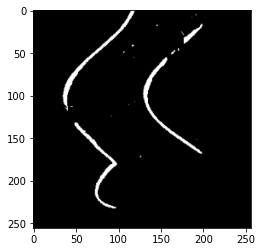

In [8]:
plt.imshow(laneData[10])


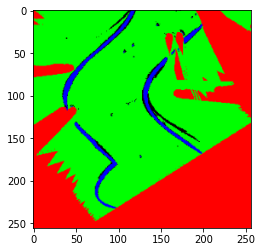

In [9]:
plt.imshow(imgData[10])

## Augmenting the Data

In [10]:
# the images are rotated by a specific offset, along with the goal, as to increase the amount of unique data the model has to train on

In [11]:
def rotateImage(angle, image):
  rad = math.radians(angle)
  center = (image.shape[1] // 2, image.shape[0] // 2)  # Center of the image

  # Get the rotation matrix
  rotationMatrix = cv2.getRotationMatrix2D(center, angle, 1.0)

  # Rotate the image
  rotatedImage = cv2.warpAffine(image, rotationMatrix, (image.shape[1], image.shape[0]))
  rotatedImage[np.all(rotatedImage==(0,0,0),axis=-1)] = (255,0,0)
  return rotatedImage

(256, 256, 3)

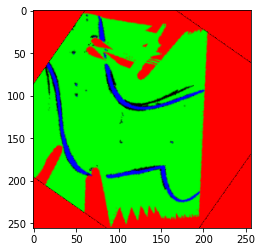

In [12]:
plt.imshow(rotateImage(55, imgData[10]))
rotateImage(55,imgData[10]).shape
#print(rotateImage(55, imgData[10]))

In [13]:
OFFSET = 45 # the angle that the image is rotated by each time

augmentedImages = []
augmentedLabels = []
augmentedLanes = []

In [14]:
for angle in range(0,360, OFFSET): #rotating the images and adding it to the array of augmented images
  print(f"getting rotated by an angle of {angle} degree")
  for image in imgData:
    rotatedImage = rotateImage(angle, image)
    augmentedImages.append(rotatedImage)
augmentedImages = np.array(augmentedImages)

min_val = np.min(augmentedImages)
max_val = np.max(augmentedImages)

augmentedImages = (augmentedImages - min_val) / (max_val - min_val) #normalizing the rgb values of the image between 0 and 1 so that model calculations are easier

getting rotated by an angle of 0 degree


getting rotated by an angle of 45 degree
getting rotated by an angle of 90 degree
getting rotated by an angle of 135 degree
getting rotated by an angle of 180 degree
getting rotated by an angle of 225 degree
getting rotated by an angle of 270 degree
getting rotated by an angle of 315 degree


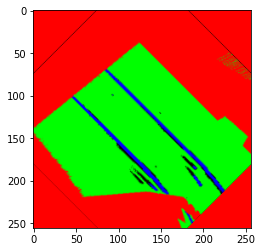

In [15]:
plt.imshow(augmentedImages[len(augmentedImages)-5])

In [16]:
for angle in range(0,360, OFFSET): #rotating the goals the same way
  rad = np.radians(angle)
  rotationMatrix = np.array([[np.cos(rad), -np.sin(rad)],
                            [np.sin(rad), np.cos(rad)]])
  labelDataOriginShifted = labelData -128
  rotatedLabels = np.dot(labelDataOriginShifted, rotationMatrix)
  rotatedLabels = rotatedLabels + 128
  rotatedLabels = np.round(rotatedLabels)
  augmentedLabels.append(rotatedLabels)

augmentedLabels = np.array(augmentedLabels)
augmentedLabels = augmentedLabels.reshape(augmentedLabels.shape[0]*augmentedLabels.shape[1],augmentedLabels.shape[2])
augmentedLabels = augmentedLabels# normalizing the coordinates between 0 and 1 so that model calculations are easier


In [17]:
for angle in range(0,360, OFFSET): #rotating the images and adding it to the array of augmented images
  print(f"getting rotated by an angle of {angle} degree")
  for image in laneData:
    rotatedImage = rotateImage(angle, image)
    augmentedLanes.append(rotatedImage)
augmentedLanes = np.array(augmentedLanes)

min_val = np.min(augmentedLanes)
max_val = np.max(augmentedLanes)

augmentedLanes = (augmentedLanes - min_val) / (max_val - min_val) #normalizing the rgb values of the image between 0 and 1 so that model calculations are easier
augmentedLanes = augmentedLanes[:,:,:,0].astype(np.float32)

getting rotated by an angle of 0 degree
getting rotated by an angle of 45 degree
getting rotated by an angle of 90 degree
getting rotated by an angle of 135 degree
getting rotated by an angle of 180 degree
getting rotated by an angle of 225 degree
getting rotated by an angle of 270 degree
getting rotated by an angle of 315 degree


In [18]:
augmentedLanes.shape

(3968, 256, 256)

## Creating the Gaussian Probability Labels

In [19]:
def gaussian(sigma, mean, x): # an equation for a 1D gaussian
    coeff = 1/ (sigma*np.sqrt(2*np.pi))
    exponent = - 0.5 * ((x-mean)/sigma)**2
    return np.exp(exponent)*coeff

def gaussian2D(sigma, mean, point): #equation for a 2d gaussian, where mean is the actual goal point, and sigma is the standard deviation for the probability distribution
    return gaussian(sigma, mean[0], point[0]) * gaussian(sigma, mean[1], point[1])

def generatePointsOnGrid(width, height): #generates the centers of each grid in the image
    points = []

    for i in range(0, width, int(np.sqrt(width))):
        for j in range(0, height, int(np.sqrt(height))):
            points.append([i+int(np.sqrt(height))/2, j+int(np.sqrt(height))/2])
    return points

def createProbablities(imgs, labels, sigma):
    _, height, width, channels = imgs.shape
    gaussianImages = []
    for i in range(len(imgs)):
        meanx,meany = labels[i][0], labels[i][1]
        x,y = np.meshgrid(np.arange(width), np.arange(height))
        x = (x - meanx)/sigma
        y = (y - meany)/sigma

        gaussianImage = (1/(sigma*sigma * 2* np.pi) )* np.exp(-0.5 * (x*x + y*y))
        lanes = imgs[i, :, :, 2]
        lanes = np.int16(lanes < 0.5)
        gaussianImage = np.minimum(gaussianImage, lanes)
        gaussianImages.append(gaussianImage)
        
    return gaussianImages

In [20]:
STANDARD_DEVIATION = 10

gaussianLabels = np.array(createProbablities(augmentedImages, augmentedLabels, STANDARD_DEVIATION))

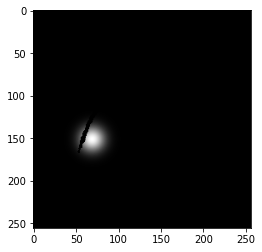

In [21]:
x = gaussianLabels[12]
plt.imshow(x, cmap="gray")

## Visualization Tools

In [22]:

def markGoals(imgs, labels):
    for i in range(len(imgs)):
        cv2.circle(imgs[i], (int(labels[i][0]), int(labels[i][1])), 10, (255,255,0), -1)

def drawGrids(imgs, gridWidth):
    print(imgs.shape)
    _, height, width, channels = imgs.shape
    for img in imgs:
        for y in range(0,height, gridWidth):
            cv2.line(img, (0,y), (width, y), (0,0,0), 1)
        for x in range(0,width, gridWidth):
            cv2.line(img, (x,0), (x,height), (0,0,0),1)    

def plotGridProbability(img, probabilities, alpha, gridWidth, trueOdds):
    height, width = img.shape[0], img.shape[1]
    
    x, y = np.ogrid[0:img.shape[0], 0:img.shape[1]]
    img = img/255
    fig = plt.figure(figsize=(15,15))

    ax = fig.add_subplot(projection='3d')

    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Probalities')
    
    pointsX, pointsY = np.meshgrid(np.array(range(0, width, int(np.sqrt(height)))), range(0, height, int(np.sqrt(height)) ))
    grid = np.reshape(probabilities, (gridWidth, gridWidth))
    dx,dy = gridWidth,gridWidth
    z = grid
    norm = plt.Normalize(z.min(), z.max())
    ax.bar3d(pointsX.ravel(), pointsY.ravel(),np.zeros_like(z).ravel(), dx, dy, z.ravel(), norm = norm, alpha=alpha)

    grid = np.reshape(trueOdds, (gridWidth, gridWidth))
    dx,dy = gridWidth,gridWidth
    z = grid
    norm = plt.Normalize(z.min(), z.max())
    ax.bar3d(pointsX.ravel(), pointsY.ravel(),np.zeros_like(z).ravel(), dx, dy, z.ravel(), norm=norm, alpha=alpha/2, color='white')


    ax.plot_surface(x,y,np.atleast_2d(0), rstride=1, cstride=1, facecolors=img)
    fig.show()   

def plotProbabilities(img, label, sigma, title, alpha, trueLabel):

    x, y = np.ogrid[0:img.shape[0], 0:img.shape[1]]
    img = img/255
    fig = plt.figure(figsize=(15,15))

    ax = fig.add_subplot(projection='3d')

    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Probalities')
    pointsX, pointsY = np.meshgrid(np.arange(img.shape[0]), np.arange(img.shape[1]))
    grid = []
    
    for i in range(img.shape[0]):
        grid.append([]) 
        for j in range(img.shape[1]):
            grid[i].append(gaussian2D(sigma, label, [i,j]))
    
    cmap = plt.cm.colors.ListedColormap(['white', 'yellow'])
    z = np.array(grid)
    z = ( z - np.min(grid) ) / ( np.max(grid) - np.min(grid) )
    norm = plt.Normalize(z.min(), z.max())
    dx,dy = 1,1
    ax.bar3d(pointsX.ravel(), pointsY.ravel(),np.zeros_like(z).ravel(), dx, dy, z.ravel(),alpha=alpha/2)
    ax.plot_surface(x,y,np.atleast_2d(0), rstride=1, cstride=1, facecolors=img)


    plt.title(f"std dev: {sigma}"+title)
    fig.show()

def plotData(imgs, titles, supertitle, filePath, save):
    fig, axes = plt.subplots(1, len(imgs), figsize=(25,5))
    for i in range(len(imgs)):
        axes[i].imshow(imgs[i])
        axes[i].set_title(titles[i])
    plt.suptitle(supertitle)
    fig.set_facecolor('lightblue')
    if (save == True):
        plt.savefig(filePath)
    plt.show()

def plotAveragedGoalFromUnet(img, label, num):
    flattenedLabel = label.ravel()
    sortedLabel = np.argsort(flattenedLabel)[::-1]
    topVals = sortedLabel[:num]
    row_indices, col_indices = np.unravel_index(topVals, label.shape)
    avgX, avgY = int(np.mean(col_indices)), int(np.mean(row_indices))
    imgCpy = np.copy(img)
    imgCpy = cv2.circle(imgCpy, (avgX, avgY), 5, (30,30,80), -1)
    return imgCpy, (avgX, avgY)

## Setting Up the Data into tensor

In [23]:
class mapDataset(Dataset):

  def __init__(self, images, lanes, labels):
    self.images = images
    self.labels = labels
    self.lanes = lanes
  def __len__(self):
    return len(self.images)

  def __getitem__(self, index):
    imgSample = self.images[index]
    labelSample = self.labels[index]
    laneSample = self.lanes[index]
    return [imgSample, laneSample, labelSample]

In [24]:
dataset = mapDataset(augmentedImages, augmentedLanes, gaussianLabels)
print(augmentedImages.shape)
print(augmentedLabels.shape[0]*0.9, 0.1*augmentedLabels.shape[0])
train,test = torch.utils.data.random_split(dataset, [3571, 397])

trainDl = torch.utils.data.DataLoader(train, batch_size=4)
testDl = torch.utils.data.DataLoader(test, batch_size=4)

(3968, 256, 256, 3)
3571.2000000000003 396.8


## Unet Architecture

<img title="U-Net Architecture" alt="U-Net Architecture" src="https://miro.medium.com/v2/resize:fit:720/format:webp/1*eQLQo43suhzuHslqy-LL3g.png">

In [25]:
class UnetLanes(nn.Module):
    def __init__(self, n_class):
        super().__init__()

        #useful link to understand convolutions
        #https://makeyourownneuralnetwork.blogspot.com/2020/02/calculating-output-size-of-convolutions.html
        
        # Encoder
        # In the encoder, convolutional layers with the Conv2d function are used to extract features from the input image. 
        # Each block in the encoder consists of two convolutional layers followed by a max-pooling layer, with the exception of the last block which does not include a max-pooling layer.
        # -------
        # input: 256x256x3
        self.e11 = nn.Conv2d(3, 64, kernel_size=3, padding=1) # output: 256x256x64
        self.e12 = nn.Conv2d(64, 64, kernel_size=3, padding=1) # output: 256x256x64
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 128x128x64

        #input: 256x256x1
        self.le11 = nn.Conv2d(1,64, kernel_size=3, padding=1) #output: 256x256x64
        self.le12 = nn.Conv2d(64,64,kernel_size=3, padding=1) #output: 256x256x64
        self.lpool1 = nn.MaxPool2d(kernel_size=2, stride=2)#output:128x128x64

        # input: 128x128x64
        self.e21 = nn.Conv2d(64, 128, kernel_size=3, padding=1) # output: 128x128x128
        self.e22 = nn.Conv2d(128,128, kernel_size=3, padding=1) # output: 128x128x128
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 64x64x128

        self.le21 = nn.Conv2d(64, 128, kernel_size=3, padding=1) # output: 128x128x128
        self.le22 = nn.Conv2d(128,128, kernel_size=3, padding=1) # output: 128x128x128
        self.lpool2 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 64x64x128

        # input: 64x64x128
        self.e31 = nn.Conv2d(128, 256, kernel_size=3, padding=1) # output: 64x64x256
        self.e32 = nn.Conv2d(256, 256, kernel_size=3, padding=1) # output: 64x64x256
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 32x32x256

        self.le31 = nn.Conv2d(128, 256, kernel_size=3, padding=1) # output: 64x64x256
        self.le32 = nn.Conv2d(256, 256, kernel_size=3, padding=1) # output: 64x64x256
        self.lpool3 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 32x32x256


        # input: 32x32x256
        self.e41 = nn.Conv2d(256,512, kernel_size=3, padding=1) # output: 32x32x512
        self.e42 = nn.Conv2d(512,512, kernel_size=3, padding=1) # output: 32x32x512
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 16x16x512

        self.le41 = nn.Conv2d(256,512, kernel_size=3, padding=1) # output: 32x32x512
        self.le42 = nn.Conv2d(512,512, kernel_size=3, padding=1) # output: 32x32x512
        self.lpool4 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 16x16x512

        # input: 16x16x512
        self.e51 = nn.Conv2d(512, 1024, kernel_size=3, padding=1) # output: 16x16x1024
        self.e52 = nn.Conv2d(1024, 1024, kernel_size=3, padding=1) # output: 16x16x1024

        self.le51 = nn.Conv2d(512,1024, kernel_size=3, padding=1)
        self.le52 = nn.Conv2d(1024, 1024, kernel_size=3, padding=1)#output: 16x16x1024

        # Decoder

        #input: 16x16x1024
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)#output: 32x32x512
        #input: 32x32x1024 (new layers have been added after concatenation from the copy and paste layer)
        self.d11 = nn.Conv2d(1024, 512, kernel_size=3, padding=1)#output:  32x32x512
        self.d12 = nn.Conv2d(512, 512, kernel_size=3, padding=1)#output: 32x32x512

        #input: 32x32x512
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)#output: 64x64x256
        #input: 64x64x512 (new layers have been added after concatenation from the copy and paste layer)
        self.d21 = nn.Conv2d(512, 256, kernel_size=3, padding=1)#output: 64x64x256
        self.d22 = nn.Conv2d(256, 256, kernel_size=3, padding=1)#output: 64x64x256

        #input: 64x64x256
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)#output:128x128x128
        #input: 128x128x256 (new layers have been added after concatenation from the copy and paste layer)
        self.d31 = nn.Conv2d(256, 128, kernel_size=3, padding=1)#output: 128x128x128
        self.d32 = nn.Conv2d(128, 128, kernel_size=3, padding=1)#output: 128x128x128

        #input: 128x128x128
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2) #output: 256x256x64
        #input: 256x256x128 (new layers have been added after concatenation from the copy and paste layer)
        self.d41 = nn.Conv2d(128, 64, kernel_size=3, padding=1)#output: 256x256x64
        self.d42 = nn.Conv2d(64, 64, kernel_size=3, padding=1)#output: 256x256x64

        # Output layer
        self.outconv = nn.Conv2d(64, n_class, kernel_size=1)#output: 256x256x1

    def forward(self, x, l):
        # Encoder
        xe11 = relu(self.e11(x))
        xe12 = relu(self.e12(xe11))
        xp1 = self.pool1(xe12)

        Lle11 = relu(self.le11(l))
        Lle12 = relu(self.le12(Lle11))
        lp1 = self.lpool1(Lle12)

        xe21 = relu(self.e21(xp1))
        xe22 = relu(self.e22(xe21))
        xp2 = self.pool2(xe22)

        Lle21 = relu(self.le21(lp1))
        Lle22 = relu(self.le22(Lle21))
        #lp2 = self.lpool2(Lle22)

        xe31 = relu(self.e31(xp2))
        xe32 = relu(self.e32(xe31))
        xp3 = self.pool3(xe32)


        xe41 = relu(self.e41(xp3))
        xe42 = relu(self.e42(xe41))
        xp4 = self.pool4(xe42)

        xe51 = relu(self.e51(xp4))
        xe52 = relu(self.e52(xe51))

        # Decoder
        xu1 = self.upconv1(xe52)
        #xu11 = torch.cat([xu1, Lle42], dim=1)
        #xd11 = relu(self.d11(xu11))
        xd12 = relu(self.d12(xu1))

        xu2 = self.upconv2(xd12)
        #xu22 = torch.cat([xu2, Lle32], dim=1)
        #xd21 = relu(self.d21(xu22))
        xd22 = relu(self.d22(xu2))

        xu3 = self.upconv3(xd22)
        xu33 = torch.cat([xu3, Lle22], dim=1)
        xd31 = relu(self.d31(xu33))
        xd32 = relu(self.d32(xd31))

        xu4 = self.upconv4(xd32)
        xu44 = torch.cat([xu4, Lle12], dim=1)
        xd41 = relu(self.d41(xu44))
        xd42 = relu(self.d42(xd41))

        # Output layer
        out = self.outconv(xd42)
        #finalOut = softmax(out)

        return out

## Creating the Model, Criterion and hyperparameters

In [26]:
ADAM_LEARNING_RATE = 0.0002
IOU_THRESHOLD = 0.0001
EPOCHS = 50

In [27]:
model = UnetLanes(n_class=1)

In [28]:
class IoULoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(IoULoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #intersection is equivalent to True Positive count
        #union is the mutually inclusive area of all labels & predictions 
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection 
        
        IoU = (intersection + smooth)/(union + smooth)
                
        return 1 - IoU


In [29]:
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice



In [30]:
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE



In [31]:
crossEntropy = nn.CrossEntropyLoss().to(GPU)
BCE = nn.BCELoss().to(GPU)
MSE = nn.MSELoss().to(GPU)
IoU = IoULoss().to(GPU)
DICE = DiceLoss().to(GPU)
DICEBCE = DiceBCELoss().to(GPU)
optimizer = torch.optim.Adam(model.parameters(), lr=ADAM_LEARNING_RATE)

## Training the Model

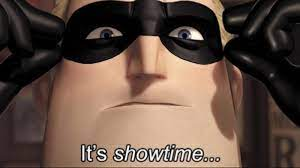

In [32]:
losses = []
model.to(GPU)
model.train()
model.cuda()

UnetLanes(
  (e11): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (e12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (le11): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (le12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (lpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (e21): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (e22): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (le21): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (le22): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (lpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (e31): Conv2d(128, 256, kernel_si

In [33]:
for epoch in range(EPOCHS):
    runningLoss = 0
    startTime = time.time()
    for i, (inputs1, inputs2, targets) in enumerate(trainDl):
        inputs1 = inputs1.view(inputs1.shape[0], inputs1.shape[3], inputs1.shape[2], inputs1.shape[1])
        inputs2 = inputs2.unsqueeze(1)
        #inputs2 = inputs2.view(inputs2.shape[0], inputs2.shape[3], inputs2.shape[2], inputs2.shape[1])
        inputs1, targets = inputs1.to(GPU), targets.to(GPU)
        inputs2 = inputs2.to(GPU)

        inputs2 = inputs2.to(torch.float32)
        inputs1 = inputs1.to(torch.float32)
        targets = targets.to(torch.float32)
        #targets = torch.where(targets>0, 1,0)
        #targets = targets.unsqueeze(0)
        
        yhat = model(inputs1, inputs2)
        yhat = yhat.squeeze(1)
        yhat = yhat.to(GPU)
        
        optimizer.zero_grad()
        
        loss = crossEntropy(yhat, targets)
        loss.backward()
        
        optimizer.step()
        runningLoss += loss.item()
        print(f"{((i+1) / len(trainDl))*100} percentage of epoch    ", end='\r')
    endTime = time.time()
    elapsedTime = endTime-startTime
    print(f"{(elapsedTime)*(epoch+1)/60} // {elapsedTime*EPOCHS/60} minutes elapsed")
    # Monitor GPU memory usage
    current_memory = torch.cuda.memory_allocated() / (1024 * 1024)  # in megabytes
    print(f"GPU Memory Usage: {current_memory} MB")

    losses.append(runningLoss)
    print("----------")
    print(f"LOSS: {runningLoss / len(trainDl)}")
    print(f"{epoch + 1} out of {EPOCHS} epochs")
    print("-----------")

print("completed training :)")

1.7419127027193706 // 87.09563513596852 minutes elapsed
GPU Memory Usage: 489.97607421875 MB
----------
LOSS: 0.02004944692049822
1 out of 50 epochs
-----------
3.4047130664189655 // 85.11782666047414 minutes elapsed
GPU Memory Usage: 491.85107421875 MB
----------
LOSS: 0.019097156559866994
2 out of 50 epochs
-----------
5.138072609901428 // 85.63454349835713 minutes elapsed
GPU Memory Usage: 491.22607421875 MB
----------
LOSS: 0.018863381377827015
3 out of 50 epochs
-----------
6.947194639841715 // 86.83993299802144 minutes elapsed
GPU Memory Usage: 491.47607421875 MB
----------
LOSS: 0.018707476020243106
4 out of 50 epochs
-----------
8.661935150623322 // 86.61935150623322 minutes elapsed
GPU Memory Usage: 489.97607421875 MB
----------
LOSS: 0.018576168188197417
5 out of 50 epochs
-----------
10.392475247383118 // 86.60396039485931 minutes elapsed
GPU Memory Usage: 490.72607421875 MB
----------
LOSS: 0.018412830512490944
6 out of 50 epochs
-----------
12.12139770189921 // 86.58141215

In [34]:
model.eval()
# 4. Forward Pass and Calculate Metrics
correct = 0
total = 0
predictions = []
images = []
labels = []
tempLanes = []
with torch.no_grad():
    runningLoss = 0
    for i, (inputs1, inputs2, targets) in enumerate(testDl):
        inputs1 = inputs1.to(torch.float32)
        
        inputs2 = inputs2.unsqueeze(1)
        inputs2 = inputs2.to(torch.float32)
        inputs2 = inputs2.view((inputs2.shape[0], inputs2.shape[1], inputs2.shape[2], inputs2.shape[3]))
        
        images.append(inputs1.numpy())
        tempLanes.append(inputs2.numpy())

        inputs1 = inputs1.view((inputs1.shape[0], inputs1.shape[3],inputs1.shape[2],inputs1.shape[1]))
        inputs1, inputs2, targets = inputs1.to(GPU), inputs2.to(GPU), targets.to(GPU)
        outputs = model(inputs1, inputs2)
        outputs = outputs.squeeze(1)
        
        loss = crossEntropy(outputs, targets)
        runningLoss += loss
        outputs = outputs.cpu()
        
        predictions.append(outputs.numpy())
        targets = targets.cpu()
        labels.append(targets.numpy())
        print(f"LOSS: {runningLoss/len(testDl)}")

LOSS: 0.00022473917355072696
LOSS: 0.0004635342067666809
LOSS: 0.0007557204221771472
LOSS: 0.0009427984751086994
LOSS: 0.0011417135740688631
LOSS: 0.00137788558145117
LOSS: 0.0016343693780511942
LOSS: 0.0019200869718684933
LOSS: 0.002103844727786899
LOSS: 0.002307388419046558
LOSS: 0.002463706579180925
LOSS: 0.0026727802623573173
LOSS: 0.0029088427071956163
LOSS: 0.003132260342650733
LOSS: 0.003396433585073282
LOSS: 0.0035529765742056954
LOSS: 0.003774132543551144
LOSS: 0.003990391148542324
LOSS: 0.004158780883921957
LOSS: 0.0043964688606679915
LOSS: 0.004650117190150476
LOSS: 0.004822105826209623
LOSS: 0.004967833855434139
LOSS: 0.00513101819926131
LOSS: 0.005397201225492944
LOSS: 0.005616290625692017
LOSS: 0.005797863873496249
LOSS: 0.005959077348817572
LOSS: 0.006143092747914476
LOSS: 0.006358427444355727
LOSS: 0.006567893304322704
LOSS: 0.006860039108702096
LOSS: 0.0070574727233702885
LOSS: 0.007231217331827018
LOSS: 0.007485583826458231
LOSS: 0.007686997884338043
LOSS: 0.007859268

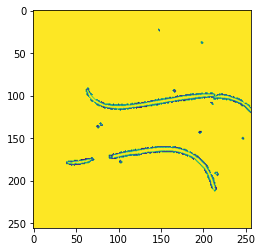

In [35]:
plt.imshow(tempLanes[0][0][0])

In [36]:
temp = []
for l in labels:
    for i in l:
        temp.append(i)
labels = temp

In [37]:
temp = []
for p in predictions:
    for i in p:
        temp.append(i)

In [38]:
predictions = (np.array(temp) - np.min(temp))/(np.max(temp)-np.min(temp))

In [39]:
temp = []
for block in images:
    for img in block:
        temp.append(img.tolist())
images = np.array(temp)
images = images*255
images = images.astype(np.uint8)
images.shape

(397, 256, 256, 3)

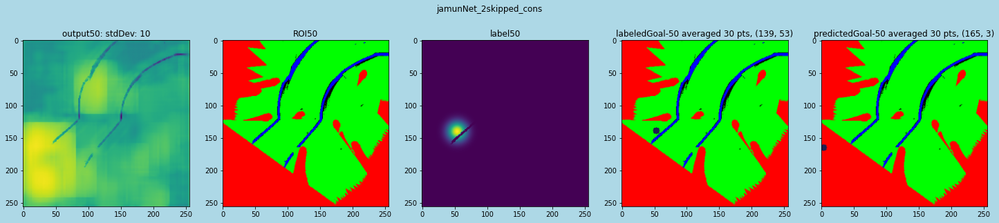

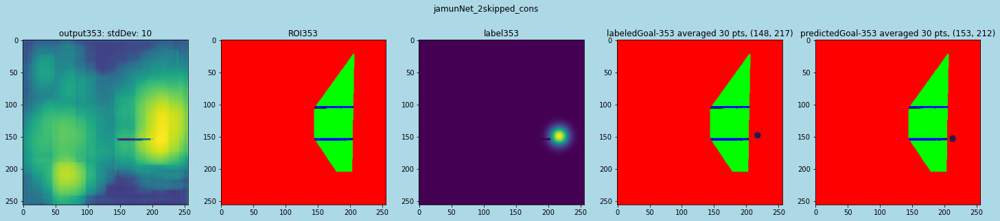

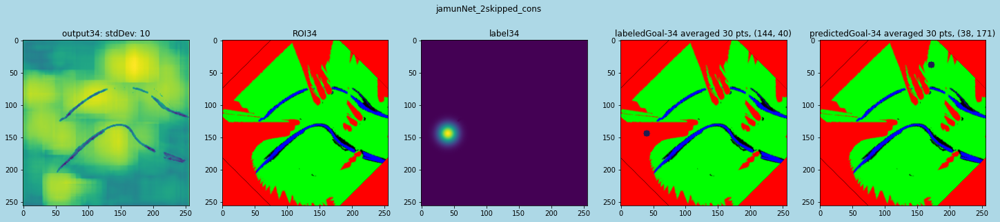

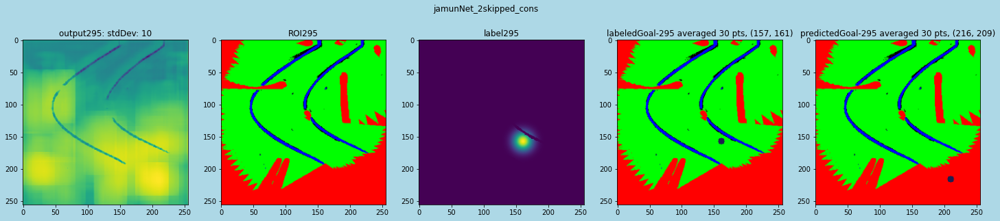

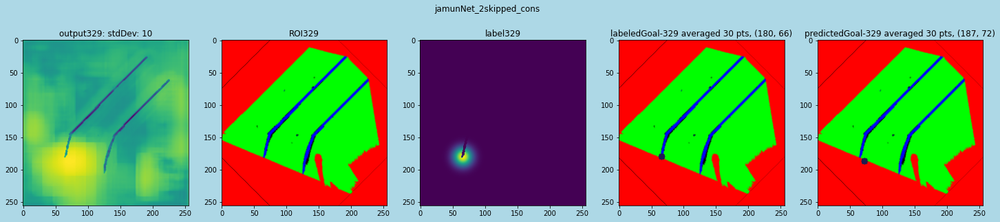

...

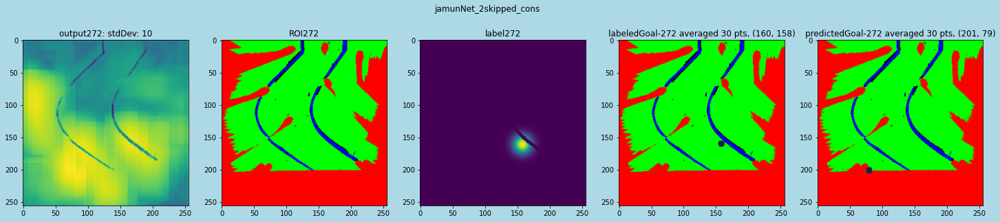

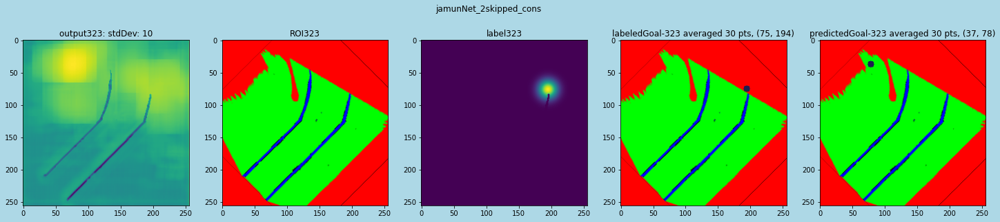

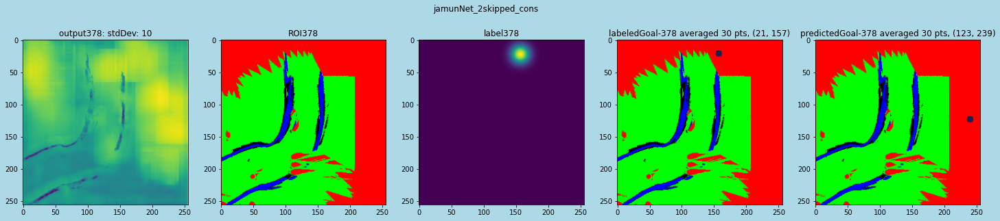

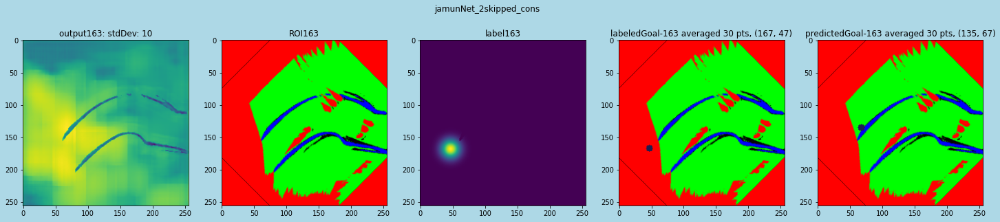

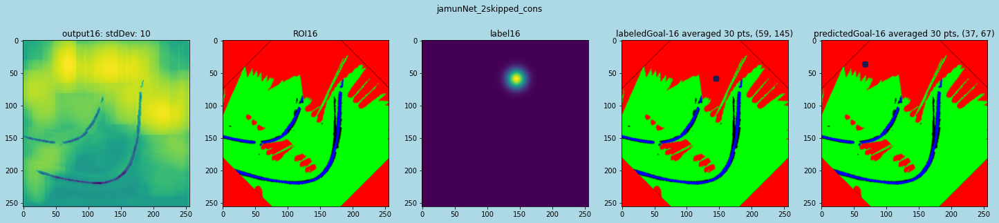

In [40]:
for i in range(100):

    x = random.randint(0, len(predictions)-1)
    supertitle = "jamunNet_top2skipped_cons" 
    imgName = r"/home/summer_20/David/UNETPredictions/"+f"{supertitle}{x}.png"
    NUMBER_OF_POINTS = 30
    labeledGoal, (labelY, labelX) = plotAveragedGoalFromUnet(images[x], labels[x], NUMBER_OF_POINTS) 
    predictedGoal, (predictedY, predictedX) = plotAveragedGoalFromUnet(images[x], predictions[x], NUMBER_OF_POINTS)
    plotData([predictions[x], images[x], labels[x], labeledGoal, predictedGoal], [f"output{x}: stdDev: {STANDARD_DEVIATION}", f"ROI{x}", f"label{x}", f"labeledGoal-{x} averaged {NUMBER_OF_POINTS} pts, {(labelX, labelY)}", f"predictedGoal-{x} averaged {NUMBER_OF_POINTS} pts, {(predictedX, predictedY)}" ], supertitle, imgName, save=True)


In [41]:

#torch.save(model.state_dict(),"jamunNet-I.pth")